In [7]:
import pandas as pd
from matplotlib import pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
%matplotlib inline

In [10]:
customer_address=pd.read_csv("customer_add.csv", index_col=[0])
customer_address.head()

,customer_id,address,postcode,state,country,property_valuation
0,1,060 Morning Avenue,2016,New South Wales,Australia,10
1,2,6 Meadow Vale Court,2153,New South Wales,Australia,10
2,4,0 Holy Cross Court,4211,QLD,Australia,9
3,5,17979 Del Mar Point,2448,New South Wales,Australia,4
4,6,9 Oakridge Court,3216,VIC,Australia,9


In [4]:
customer_transaction=pd.read_csv("customer_trans.csv", index_col=[0])
customer_transaction.head()

,transaction_id,product_id,customer_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date
0,1,2,2950,2017-02-25,0.0,Approved,Solex,Standard,medium,medium,71.49,53.62,41245.0
1,2,3,3120,2017-05-21,1.0,Approved,Trek Bicycles,Standard,medium,large,2091.47,388.92,41701.0
2,3,37,402,2017-10-16,0.0,Approved,OHM Cycles,Standard,low,medium,1793.43,248.82,36361.0
3,4,88,3135,2017-08-31,0.0,Approved,Norco Bicycles,Standard,medium,medium,1198.46,381.10,36145.0
4,5,78,787,2017-10-01,1.0,Approved,Giant Bicycles,Standard,medium,large,1765.30,709.48,42226.0


In [5]:
customer_demograph=pd.read_csv("customer_demograph.csv", index_col=[0])
customer_demograph

,customer_id,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,tenure,age
0,1,Laraine,Medendorp,Female,93,1953-10-12,Executive Secretary,Health,Mass Customer,N,Yes,11.0,69
1,2,Eli,Bockman,Male,81,1980-12-16,Administrative Officer,Financial Services,Mass Customer,N,Yes,16.0,42
2,3,Arlin,Dearle,Male,61,1954-01-20,Recruiting Manager,Property,Mass Customer,N,Yes,15.0,68
3,4,Talbot,Pristnor,Male,33,1961-10-03,Business Systems Development Analyst,IT,Mass Customer,N,No,7.0,61
4,5,Sheila-kathryn,Calton,Female,56,1977-05-13,Senior Editor,Manufacturing,Affluent Customer,N,Yes,8.0,45
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3994,3995,Rusty,Iapico,Male,93,1975-12-12,Staff Scientist,Manufacturing,Mass Customer,N,Yes,14.0,47
3995,3996,Rosalia,Halgarth,Female,8,1975-08-09,VP Product Management,Health,Mass Customer,N,No,19.0,47
3996,3997,Blanch,Nisuis,Female,87,2001-07-13,Statistician II,Manufacturing,High Net Worth,N,Yes,1.0,21
3998,3999,Patrizius,Pristnor,Male,11,1973-10-24,Business Systems Development Analyst,Manufacturing,Affluent Customer,N,Yes,10.0,49


# Merge Customer Address , Demograph and Transaction

In [6]:
customer_add_demog=pd.merge(customer_address, customer_demograph, on='customer_id')
customer_add_demog.head()

,customer_id,address,postcode,state,country,property_valuation,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,tenure,age
0,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,1953-10-12,Executive Secretary,Health,Mass Customer,N,Yes,11.0,69
1,2,6 Meadow Vale Court,2153,New South Wales,Australia,10,Eli,Bockman,Male,81,1980-12-16,Administrative Officer,Financial Services,Mass Customer,N,Yes,16.0,42
2,4,0 Holy Cross Court,4211,QLD,Australia,9,Talbot,Pristnor,Male,33,1961-10-03,Business Systems Development Analyst,IT,Mass Customer,N,No,7.0,61
3,5,17979 Del Mar Point,2448,New South Wales,Australia,4,Sheila-kathryn,Calton,Female,56,1977-05-13,Senior Editor,Manufacturing,Affluent Customer,N,Yes,8.0,45
4,6,9 Oakridge Court,3216,VIC,Australia,9,Curr,Duckhouse,Male,35,1966-09-16,Business Systems Development Analyst,Retail,High Net Worth,N,Yes,13.0,56


In [7]:
customer_add_demog.shape

(3908, 18)

In [8]:
customer_info=pd.merge(customer_add_demog, customer_transaction, on='customer_id', how='inner')

In [9]:
customer_info.head()

,customer_id,address,postcode,state,country,property_valuation,first_name,last_name,gender,past_3_years_bike_related_purchases,...,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date
0,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,2017-12-23,0.0,Approved,OHM Cycles,Standard,medium,medium,235.63,125.07,38482.0
1,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,2017-04-06,1.0,Approved,Solex,Standard,medium,medium,1577.53,826.51,39526.0
2,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,2017-05-11,1.0,Approved,Trek Bicycles,Road,low,small,1720.70,1531.42,37823.0
3,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,2017-01-05,0.0,Approved,Norco Bicycles,Standard,medium,medium,360.40,270.30,37873.0
4,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,2017-02-21,0.0,Approved,Solex,Standard,medium,medium,71.49,53.62,38573.0


In [10]:
customer_info.empty

False

In [11]:
grp_trans=customer_info.sort_values(['customer_id','transaction_date']).groupby(['transaction_date'])
grp_trans.head()

,customer_id,address,postcode,state,country,property_valuation,first_name,last_name,gender,past_3_years_bike_related_purchases,...,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date
3,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,2017-01-05,0.0,Approved,Norco Bicycles,Standard,medium,medium,360.40,270.30,37873.0
4,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,2017-02-21,0.0,Approved,Solex,Standard,medium,medium,71.49,53.62,38573.0
6,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,2017-03-27,0.0,Approved,Norco Bicycles,Mountain,low,small,688.63,612.88,33455.0
10,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,2017-03-29,1.0,Approved,Giant Bicycles,Standard,high,medium,1274.93,764.96,35378.0
1,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,2017-04-06,1.0,Approved,Solex,Standard,medium,medium,1577.53,826.51,39526.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4581,843,71801 Grover Point,2166,NSW,Australia,10,Salomone,Sleford,Male,80,...,2017-03-31,0.0,Approved,Solex,Standard,medium,medium,1945.43,333.18,36668.0
4623,853,49 Buhler Plaza,2650,NSW,Australia,2,Nolana,Rotter,Female,26,...,2017-06-27,1.0,Approved,Giant Bicycles,Standard,medium,large,569.56,528.43,34527.0
4638,855,3 Magdeline Way,4415,QLD,Australia,2,Bennie,Llywarch,Female,74,...,2017-06-27,0.0,Approved,Giant Bicycles,Road,medium,medium,1538.99,829.65,42226.0
4699,868,519 Maywood Pass,2768,NSW,Australia,10,Effie,Duddy,Female,84,...,2017-03-31,1.0,Approved,Solex,Standard,high,medium,748.17,448.90,33888.0


In [12]:
grp_wealth=customer_info.groupby(['wealth_segment','age'])['transaction_id'].count().sort_values(ascending=False).reset_index()
grp_wealth.columns=['Wealth_Segment', 'age','No_of_transactions']
grp_wealth

,Wealth_Segment,age,No_of_transactions
0,Mass Customer,44,520
1,Mass Customer,45,514
2,Mass Customer,43,369
3,Mass Customer,48,343
4,Mass Customer,46,338
...,...,...,...
150,High Net Worth,79,7
151,High Net Worth,20,5
152,Affluent Customer,78,5
153,Mass Customer,87,5


# Preprocessing Data for Segmentation
# RFM is commonly used in marketing to evaluate a client’s value based on their:

# Recency: How recently have they made a purchase?
# Frequency: How often have they bought something?
# Monetary Value: How much money do they spend on average when making purchases?

# Converting transaction datatype object to datatime datatype

In [13]:
customer_info['transaction_date']=pd.to_datetime(customer_info['transaction_date'])

# Recency

In [14]:
customer_info['rank']=customer_info.sort_values(['customer_id','transaction_date']).groupby(['customer_id'])['transaction_date'].rank(method='min').astype(int)
customer_info.head()

,customer_id,address,postcode,state,country,property_valuation,first_name,last_name,gender,past_3_years_bike_related_purchases,...,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date,rank
0,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,0.0,Approved,OHM Cycles,Standard,medium,medium,235.63,125.07,38482.0,11
1,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,1.0,Approved,Solex,Standard,medium,medium,1577.53,826.51,39526.0,5
2,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,1.0,Approved,Trek Bicycles,Road,low,small,1720.70,1531.42,37823.0,6
3,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,0.0,Approved,Norco Bicycles,Standard,medium,medium,360.40,270.30,37873.0,1
4,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,0.0,Approved,Solex,Standard,medium,medium,71.49,53.62,38573.0,2


In [15]:
customer_info['recency']=(customer_info['transaction_date']-pd.to_datetime(min(customer_info['transaction_date']))).dt.days

In [16]:
customer_info[customer_info['rank']==1]

,customer_id,address,postcode,state,country,property_valuation,first_name,last_name,gender,past_3_years_bike_related_purchases,...,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date,rank,recency
3,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,Approved,Norco Bicycles,Standard,medium,medium,360.40,270.30,37873.0,1,4
11,2,6 Meadow Vale Court,2153,New South Wales,Australia,10,Eli,Bockman,Male,81,...,Approved,Giant Bicycles,Standard,medium,medium,1403.50,954.82,40784.0,1,123
14,4,0 Holy Cross Court,4211,QLD,Australia,9,Talbot,Pristnor,Male,33,...,Approved,Giant Bicycles,Standard,medium,large,569.56,528.43,37874.0,1,92
17,5,17979 Del Mar Point,2448,New South Wales,Australia,4,Sheila-kathryn,Calton,Female,56,...,Approved,Norco Bicycles,Mountain,low,small,688.63,612.88,34244.0,1,61
25,6,9 Oakridge Court,3216,VIC,Australia,9,Curr,Duckhouse,Male,35,...,Approved,WeareA2B,Standard,medium,medium,1769.64,108.76,41848.0,1,27
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18579,3496,2565 Caliangt Point,2171,NSW,Australia,9,Danya,Burnyeat,Male,99,...,Approved,Trek Bicycles,Mountain,low,medium,574.64,459.71,37659.0,1,65
18582,3497,96 Delladonna Trail,3976,VIC,Australia,5,Thia,O'Day,Female,73,...,Approved,Solex,Standard,medium,medium,575.27,431.45,35160.0,1,243
18587,3498,3 Nova Point,3012,VIC,Australia,4,Lois,Abrahim,Female,28,...,Approved,WeareA2B,Standard,medium,medium,1231.15,161.60,38216.0,1,33
18592,3499,310 Stephen Terrace,4073,QLD,Australia,9,Shelton,Tewkesberrie,Male,29,...,Approved,Solex,Standard,medium,medium,478.16,298.72,36146.0,1,11


# Frequency

In [17]:
cust_freq=customer_info.groupby('customer_id')['transaction_date'].count()
cust_freq1=pd.DataFrame(cust_freq).reset_index()
cust_freq1.columns=['customer_id','frequency']
cust_freq1

,customer_id,frequency
0,1,11
1,2,3
2,4,2
3,5,6
4,6,5
...,...,...
3402,3496,4
3403,3497,3
3404,3498,6
3405,3499,7


# Merge requency in customer_info dataframe

In [18]:
#customer_info1=pd.merge(cust_freq1, customer_info, on='customer_id')
customer_info1=customer_info.merge(cust_freq1, on='customer_id')

In [19]:
#customer_info.rename(columns={'frequency_x':'frequency'})

In [20]:
customer_info1[(customer_info1.customer_id==1)]

,customer_id,address,postcode,state,country,property_valuation,first_name,last_name,gender,past_3_years_bike_related_purchases,...,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date,rank,recency,frequency
0,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,OHM Cycles,Standard,medium,medium,235.63,125.07,38482.0,11,356,11
1,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,Solex,Standard,medium,medium,1577.53,826.51,39526.0,5,95,11
2,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,Trek Bicycles,Road,low,small,1720.70,1531.42,37823.0,6,130,11
3,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,Norco Bicycles,Standard,medium,medium,360.40,270.30,37873.0,1,4,11
4,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,Solex,Standard,medium,medium,71.49,53.62,38573.0,2,51,11
5,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,Giant Bicycles,Road,medium,medium,1538.99,829.65,33552.0,7,138,11
6,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,Norco Bicycles,Mountain,low,small,688.63,612.88,33455.0,3,85,11
7,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,Giant Bicycles,Standard,medium,medium,230.91,173.18,37337.0,10,347,11
8,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,Giant Bicycles,Standard,medium,medium,642.70,211.37,40618.0,8,154,11
9,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,OHM Cycles,Road,medium,medium,742.54,667.40,37838.0,9,342,11


# Monetary Value

In [21]:
x=customer_info1.groupby('customer_id')['list_price'].sum()
x.head()

customer_id
1    9084.45
2    4149.07
4    1047.72
5    5903.20
6    5931.69
Name: list_price, dtype: float64

In [22]:
x=pd.DataFrame(x).reset_index()
x.columns=['customer_id','monetary_value']

In [23]:
customer_info2=customer_info1.merge(x, on='customer_id')
customer_info2.head()

,customer_id,address,postcode,state,country,property_valuation,first_name,last_name,gender,past_3_years_bike_related_purchases,...,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date,rank,recency,frequency,monetary_value
0,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,Standard,medium,medium,235.63,125.07,38482.0,11,356,11,9084.45
1,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,Standard,medium,medium,1577.53,826.51,39526.0,5,95,11,9084.45
2,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,Road,low,small,1720.70,1531.42,37823.0,6,130,11,9084.45
3,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,Standard,medium,medium,360.40,270.30,37873.0,1,4,11,9084.45
4,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,Standard,medium,medium,71.49,53.62,38573.0,2,51,11,9084.45


In [24]:
customer_info2[(customer_info2.customer_id==6)]

,customer_id,address,postcode,state,country,property_valuation,first_name,last_name,gender,past_3_years_bike_related_purchases,...,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date,rank,recency,frequency,monetary_value
22,6,9 Oakridge Court,3216,VIC,Australia,9,Curr,Duckhouse,Male,35,...,Standard,high,medium,358.39,215.03,33364.0,3,140,5,5931.69
23,6,9 Oakridge Court,3216,VIC,Australia,9,Curr,Duckhouse,Male,35,...,Standard,medium,medium,230.91,173.18,36361.0,4,258,5,5931.69
24,6,9 Oakridge Court,3216,VIC,Australia,9,Curr,Duckhouse,Male,35,...,Standard,medium,medium,1807.45,778.69,40410.0,5,299,5,5931.69
25,6,9 Oakridge Court,3216,VIC,Australia,9,Curr,Duckhouse,Male,35,...,Standard,medium,medium,1769.64,108.76,41848.0,1,27,5,5931.69
26,6,9 Oakridge Court,3216,VIC,Australia,9,Curr,Duckhouse,Male,35,...,Standard,medium,large,1765.30,709.48,42226.0,2,36,5,5931.69


# Final data set of RFM

In [25]:
rfm_cust=customer_info2[['customer_id','recency','frequency','monetary_value']]
rfm_cust

,customer_id,recency,frequency,monetary_value
0,1,356,11,9084.45
1,1,95,11,9084.45
2,1,130,11,9084.45
3,1,4,11,9084.45
4,1,51,11,9084.45
...,...,...,...,...
18598,3500,8,6,4922.41
18599,3500,46,6,4922.41
18600,3500,219,6,4922.41
18601,3500,10,6,4922.41


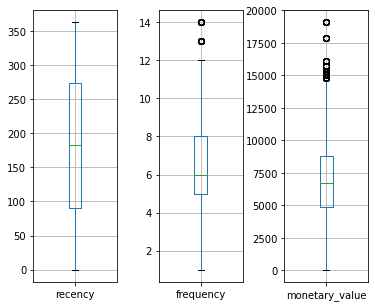

In [26]:
fig, ax = plt.subplots(1,3, figsize=(6,5))
rfm_cust.boxplot('recency',ax=ax[0])
rfm_cust.boxplot('frequency',ax=ax[1])
rfm_cust.boxplot('monetary_value',ax=ax[2])
plt.subplots_adjust(wspace=0.5)
plt.show()

In [27]:
from scipy import stats
import numpy as np
new_df=rfm_cust[['recency','frequency','monetary_value']]
#remove outliers
z_scores=stats.zscore(new_df)
abs_z_scores=np.abs(z_scores)
cust_entry=(abs_z_scores<6).all(axis=1)  # Standard cut of value is 3 threshold
new_df1=new_df[cust_entry]
new_df1.shape

(18603, 3)

# Standardization

In [28]:
from sklearn.preprocessing import StandardScaler
col_names=['recency','frequency','monetary_value']
features=new_df1[col_names]
scalar=StandardScaler().fit(features.values)
features=scalar.transform(features.values)
scaled_features=pd.DataFrame(features, columns=col_names)
scaled_features

,recency,frequency,monetary_value
0,1.654825,2.028707,0.740483
1,-0.822137,2.028707,0.740483
2,-0.489977,2.028707,0.740483
3,-1.685752,2.028707,0.740483
4,-1.239709,2.028707,0.740483
...,...,...,...
18598,-1.647791,-0.172494,-0.707622
18599,-1.287160,-0.172494,-0.707622
18600,0.354657,-0.172494,-0.707622
18601,-1.628810,-0.172494,-0.707622


# Building the Customer Segmentation Model

Text(0, 0.5, 'Inertia')

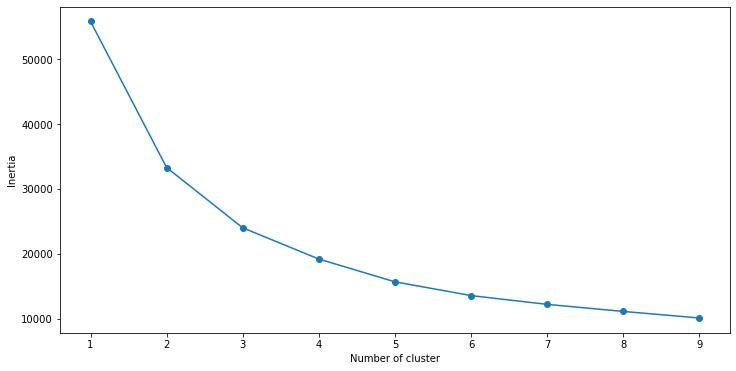

In [29]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
#from mpl_toolkit.mplot3d import Axes3D
SSE=[]

for cluster in range(1,10):
    kmeans=KMeans(n_clusters = cluster, init='k-means++')
    kmeans.fit(scaled_features)
    SSE.append(kmeans.inertia_)

# Converting the results into a dataframe and plotting them

frame = pd.DataFrame({'cluster':range(1,10), 'SSE':SSE})
plt.figure(figsize=(12,6))
plt.plot(frame['cluster'], frame['SSE'], marker='o')
plt.xlabel('Number of cluster')
plt.ylabel('Inertia')

In [30]:
# First build a model with 4 clusters
kmeans=KMeans(n_clusters = 4, init='k-means++')
kmeans.fit(scaled_features)

KMeans(n_clusters=4)

In [31]:
print(silhouette_score(scaled_features, kmeans.labels_, metric='euclidean'))

0.3186923185410564


In [32]:
predict=kmeans.fit_predict(scaled_features)
cluster_data=pd.DataFrame(new_df1)
cluster_data['cluster']=predict
cluster_data

,recency,frequency,monetary_value,cluster
0,356,11,9084.45,3
1,95,11,9084.45,3
2,130,11,9084.45,3
3,4,11,9084.45,1
4,51,11,9084.45,1
...,...,...,...,...
18598,8,6,4922.41,2
18599,46,6,4922.41,2
18600,219,6,4922.41,0
18601,10,6,4922.41,2


In [33]:
predict

array([3, 3, 3, ..., 0, 2, 2])

In [34]:
len(predict)

18603

In [35]:
cluster_centers =  kmeans.cluster_centers_
data=np.expm1(cluster_centers)
points=np.append(data, cluster_centers, axis=1)
points

array([[ 1.54171134, -0.35571652, -0.36008875,  0.93283761, -0.43961647,
        -0.44642579],
       [-0.58987801,  0.48568445,  0.48919358, -0.89130062,  0.39587557,
         0.39823475],
       [-0.51834999, -0.61753326, -0.61864345, -0.73053756, -0.96111359,
        -0.96402051],
       [ 0.65018938,  2.67287538,  2.71369686,  0.50089006,  1.30097484,
         1.31202784]])

In [36]:
kmeans.labels_

array([3, 3, 3, ..., 0, 2, 2])

In [37]:
rfm_cust['clusters']=kmeans.labels_

C:\Users\student\AppData\Local\Temp/ipykernel_26024/3701442781.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rfm_cust['clusters']=kmeans.labels_


In [38]:
#Final Output with cluster numbers
rfm_cust

,customer_id,recency,frequency,monetary_value,clusters
0,1,356,11,9084.45,3
1,1,95,11,9084.45,3
2,1,130,11,9084.45,3
3,1,4,11,9084.45,1
4,1,51,11,9084.45,1
...,...,...,...,...,...
18598,3500,8,6,4922.41,2
18599,3500,46,6,4922.41,2
18600,3500,219,6,4922.41,0
18601,3500,10,6,4922.41,2


In [39]:
figure=px.scatter_3d(rfm_cust, color='clusters', x='recency', y='frequency', z='monetary_value',
                    category_orders={"clusters":["0","1","2","3"]})
figure.update_layout()
figure.show()

In [40]:
#predicted_cluster=pd.DataFrame(cluster_data.groupby(['cluster'])['recency','frequency','monetary_value'].count()).reset_index()
#predicted_cluster

<AxesSubplot:xlabel='clusters', ylabel='recency'>

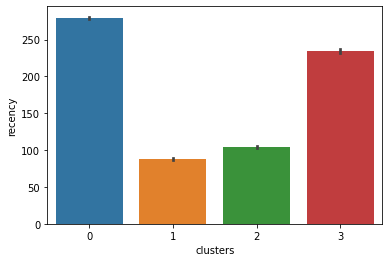

In [41]:
import seaborn as sns
sns.barplot(x='clusters', y='recency', data=rfm_cust)

<AxesSubplot:xlabel='clusters', ylabel='frequency'>

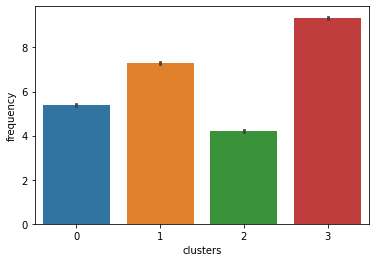

In [42]:
sns.barplot(x='clusters', y='frequency', data=rfm_cust)

<AxesSubplot:xlabel='clusters', ylabel='monetary_value'>

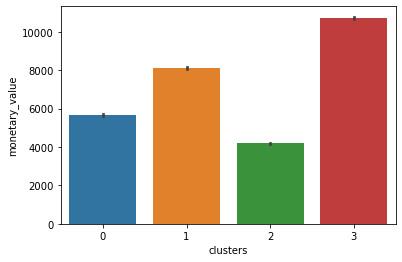

In [43]:
sns.barplot(x='clusters', y='monetary_value', data=rfm_cust)

<BarContainer object of 155 artists>

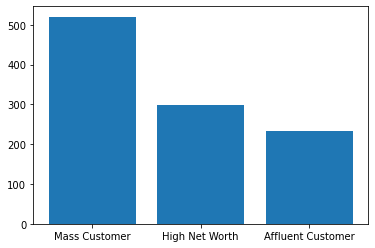

In [44]:
plt.bar(grp_wealth['Wealth_Segment'],grp_wealth['No_of_transactions'])

Text(0.5, 1.0, 'Age vs No of transactions')

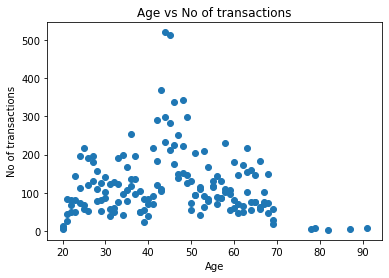

In [45]:
plt.scatter(grp_wealth['age'], grp_wealth['No_of_transactions'])
plt.xlabel('Age')
plt.ylabel('No of transactions')
plt.title("Age vs No of transactions")

<BarContainer object of 155 artists>

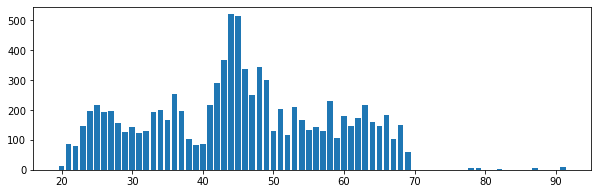

In [46]:
plt.figure(figsize=(10,3))
plt.bar(grp_wealth['age'], grp_wealth['No_of_transactions'])

In [47]:
grp_address=customer_info.groupby(['address','state','postcode'])['transaction_id'].count().sort_values(ascending=False).reset_index()
grp_address.columns=['Address','State','Postal code','No of transactions']
grp_address.head()

,Address,State,Postal code,No of transactions
0,4297 Emmet Lane,NSW,2170,14
1,8142 Tomscot Drive,QLD,4132,14
2,567 Scott Park,QLD,4118,14
3,3126 Butterfield Pass,NSW,2573,13
4,7916 Clyde Gallagher Place,NSW,2075,13


<BarContainer object of 3407 artists>

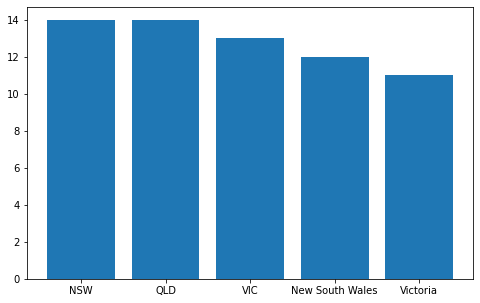

In [48]:
plt.figure(figsize=(8,5))
plt.bar(grp_address['State'], grp_address['No of transactions'])

In [49]:
grp_brand=customer_info.groupby(['brand'])['transaction_id'].count().sort_values(ascending=False).reset_index()
grp_brand.columns=['Brand', 'No_of_transactions']
grp_brand

,Brand,No_of_transactions
0,Solex,4088
1,WeareA2B,3153
2,Giant Bicycles,2988
3,Trek Bicycles,2857
4,Norco Bicycles,2783
5,OHM Cycles,2734


<BarContainer object of 6 artists>

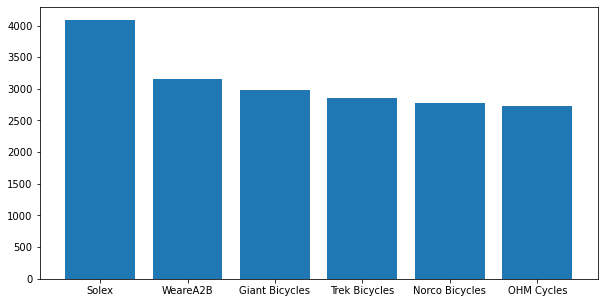

In [50]:
plt.figure(figsize=(10,5))
plt.bar(grp_brand['Brand'], grp_brand['No_of_transactions'])

In [51]:
customer_info[(customer_info.customer_id==1)]

,customer_id,address,postcode,state,country,property_valuation,first_name,last_name,gender,past_3_years_bike_related_purchases,...,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date,rank,recency
0,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,Approved,OHM Cycles,Standard,medium,medium,235.63,125.07,38482.0,11,356
1,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,Approved,Solex,Standard,medium,medium,1577.53,826.51,39526.0,5,95
2,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,Approved,Trek Bicycles,Road,low,small,1720.70,1531.42,37823.0,6,130
3,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,Approved,Norco Bicycles,Standard,medium,medium,360.40,270.30,37873.0,1,4
4,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,Approved,Solex,Standard,medium,medium,71.49,53.62,38573.0,2,51
5,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,Approved,Giant Bicycles,Road,medium,medium,1538.99,829.65,33552.0,7,138
6,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,Approved,Norco Bicycles,Mountain,low,small,688.63,612.88,33455.0,3,85
7,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,Approved,Giant Bicycles,Standard,medium,medium,230.91,173.18,37337.0,10,347
8,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,Approved,Giant Bicycles,Standard,medium,medium,642.70,211.37,40618.0,8,154
9,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,...,Approved,OHM Cycles,Road,medium,medium,742.54,667.40,37838.0,9,342


In [52]:
customer_info['customer_id'].duplicated().value_counts()

True     15196
False     3407
Name: customer_id, dtype: int64

In [53]:
customer_info.shape

(18603, 32)

In [54]:
cust_group=customer_info.groupby(['customer_id'])
cust_group['state'].value_counts().loc[3496]

state
NSW    4
Name: state, dtype: int64

In [55]:
customer_info.columns

Index(['customer_id', 'address', 'postcode', 'state', 'country',
       'property_valuation', 'first_name', 'last_name', 'gender',
       'past_3_years_bike_related_purchases', 'DOB', 'job_title',
       'job_industry_category', 'wealth_segment', 'deceased_indicator',
       'owns_car', 'tenure', 'age', 'transaction_id', 'product_id',
       'transaction_date', 'online_order', 'order_status', 'brand',
       'product_line', 'product_class', 'product_size', 'list_price',
       'standard_cost', 'product_first_sold_date', 'rank', 'recency'],
      dtype='object')

In [56]:
max_trans=customer_info.groupby(['customer_id'])['transaction_id'].count().sort_values(ascending=False).reset_index()
max_trans.columns=['customer id','No of Transactions']
max_trans.head()

,customer id,No of Transactions
0,1068,14
1,2183,14
2,2476,14
3,3232,13
4,3326,13


In [57]:
pd.options.display.max_columns = None
pd.options.display.max_rows = None
customer_info[(customer_info.customer_id)==1].head()

,customer_id,address,postcode,state,country,property_valuation,first_name,last_name,gender,past_3_years_bike_related_purchases,DOB,job_title,job_industry_category,wealth_segment,deceased_indicator,owns_car,tenure,age,transaction_id,product_id,transaction_date,online_order,order_status,brand,product_line,product_class,product_size,list_price,standard_cost,product_first_sold_date,rank,recency
0,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,1953-10-12,Executive Secretary,Health,Mass Customer,N,Yes,11.0,69,94,86,2017-12-23,0.0,Approved,OHM Cycles,Standard,medium,medium,235.63,125.07,38482.0,11,356
1,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,1953-10-12,Executive Secretary,Health,Mass Customer,N,Yes,11.0,69,3765,38,2017-04-06,1.0,Approved,Solex,Standard,medium,medium,1577.53,826.51,39526.0,5,95
2,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,1953-10-12,Executive Secretary,Health,Mass Customer,N,Yes,11.0,69,5157,47,2017-05-11,1.0,Approved,Trek Bicycles,Road,low,small,1720.70,1531.42,37823.0,6,130
3,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,1953-10-12,Executive Secretary,Health,Mass Customer,N,Yes,11.0,69,9785,72,2017-01-05,0.0,Approved,Norco Bicycles,Standard,medium,medium,360.40,270.30,37873.0,1,4
4,1,060 Morning Avenue,2016,New South Wales,Australia,10,Laraine,Medendorp,Female,93,1953-10-12,Executive Secretary,Health,Mass Customer,N,Yes,11.0,69,13424,2,2017-02-21,0.0,Approved,Solex,Standard,medium,medium,71.49,53.62,38573.0,2,51


In [58]:
customer_grp=customer_info.groupby(['customer_id','first_name','last_name','gender','age','address','state','country','postcode','owns_car','tenure','past_3_years_bike_related_purchases','property_valuation','job_title','job_industry_category','wealth_segment', 'brand','transaction_date'])['transaction_id'].count().sort_values(ascending=False).reset_index()
customer_grp.columns=['customer_id','first name','last name','gender','age','Address','state','country','postal code','owner car','tenure','Past 3 year bike purchase','property valuation','job title','job industry category','wealth segment','brand','transaction date','No of transactions']
customer_grp.head()

,customer_id,first name,last name,gender,age,Address,state,country,postal code,owner car,tenure,Past 3 year bike purchase,property valuation,job title,job industry category,wealth segment,brand,transaction date,No of transactions
0,696,Arch,Gaitskill,Male,56,0650 Sachs Circle,NSW,Australia,2769,Yes,6.0,57,10,Programmer Analyst II,Manufacturing,Affluent Customer,OHM Cycles,2017-03-20,2
1,2537,Peggi,Tolan,Female,33,3144 Ruskin Trail,NSW,Australia,2046,Yes,12.0,8,11,Senior Quality Engineer,Manufacturing,Affluent Customer,Solex,2017-01-29,2
2,292,Gelya,Gerant,Female,61,2 Brentwood Place,QLD,Australia,4151,Yes,9.0,42,8,VP Product Management,Manufacturing,Affluent Customer,Solex,2017-03-03,2
3,2183,Jillie,Fyndon,Female,50,8142 Tomscot Drive,QLD,Australia,4132,Yes,7.0,61,4,Programmer Analyst IV,Manufacturing,Mass Customer,Giant Bicycles,2017-05-09,2
4,981,Bud,Smittoune,Male,49,36 Grayhawk Plaza,NSW,Australia,2031,No,11.0,0,9,Business Systems Development Analyst,Retail,Mass Customer,Giant Bicycles,2017-05-25,2


In [59]:
customer_grp.to_csv("customergrp.csv")

In [60]:
customer_grp[(customer_grp.customer_id==1503)]

,customer_id,first name,last name,gender,age,Address,state,country,postal code,owner car,tenure,Past 3 year bike purchase,property valuation,job title,job industry category,wealth segment,brand,transaction date,No of transactions
14300,1503,Del,Scullin,Female,54,75 Hoepker Street,NSW,Australia,2232,No,6.0,1,10,Media Manager III,Manufacturing,Affluent Customer,Giant Bicycles,2017-01-29,1
14301,1503,Del,Scullin,Female,54,75 Hoepker Street,NSW,Australia,2232,No,6.0,1,10,Media Manager III,Manufacturing,Affluent Customer,Trek Bicycles,2017-07-23,1
14302,1503,Del,Scullin,Female,54,75 Hoepker Street,NSW,Australia,2232,No,6.0,1,10,Media Manager III,Manufacturing,Affluent Customer,Trek Bicycles,2017-06-07,1
14303,1503,Del,Scullin,Female,54,75 Hoepker Street,NSW,Australia,2232,No,6.0,1,10,Media Manager III,Manufacturing,Affluent Customer,Trek Bicycles,2017-04-12,1
14304,1503,Del,Scullin,Female,54,75 Hoepker Street,NSW,Australia,2232,No,6.0,1,10,Media Manager III,Manufacturing,Affluent Customer,Trek Bicycles,2017-02-02,1
14305,1503,Del,Scullin,Female,54,75 Hoepker Street,NSW,Australia,2232,No,6.0,1,10,Media Manager III,Manufacturing,Affluent Customer,Trek Bicycles,2017-01-15,1
14306,1503,Del,Scullin,Female,54,75 Hoepker Street,NSW,Australia,2232,No,6.0,1,10,Media Manager III,Manufacturing,Affluent Customer,Giant Bicycles,2017-07-06,1


In [61]:
cate_features=[col for col in customer_grp.columns if customer_grp[col].dtype=='object']
cate_features

['first name',
 'last name',
 'gender',
 'Address',
 'state',
 'country',
 'owner car',
 'job title',
 'job industry category',
 'wealth segment',
 'brand']

In [62]:
num_features=[col for col in customer_grp.columns if customer_grp[col].dtype!='object']
num_features

['customer_id',
 'age',
 'postal code',
 'tenure',
 'Past 3 year bike purchase',
 'property valuation',
 'transaction date',
 'No of transactions']

In [63]:
customer_info.sort_values(by=['first_name','last_name'])[['customer_id','first_name','last_name','age','address','list_price']]

,customer_id,first_name,last_name,age,address,list_price
7313,1368,Aarika,Magog,49,03444 Scott Lane,642.31
7314,1368,Aarika,Magog,49,03444 Scott Lane,569.56
7315,1368,Aarika,Magog,49,03444 Scott Lane,1577.53
7316,1368,Aarika,Magog,49,03444 Scott Lane,752.64
7317,1368,Aarika,Magog,49,03444 Scott Lane,1466.68
7318,1368,Aarika,Magog,49,03444 Scott Lane,1873.97
859,164,Aarika,Van Vuuren,23,2054 Sommers Pass,1148.64
860,164,Aarika,Van Vuuren,23,2054 Sommers Pass,642.31
861,164,Aarika,Van Vuuren,23,2054 Sommers Pass,792.90
2790,508,Abagail,Tordiffe,51,4 Thackeray Pass,1555.58


In [64]:
customer_info.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18603 entries, 0 to 18602
Data columns (total 32 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   customer_id                          18603 non-null  int64         
 1   address                              18603 non-null  object        
 2   postcode                             18603 non-null  int64         
 3   state                                18603 non-null  object        
 4   country                              18603 non-null  object        
 5   property_valuation                   18603 non-null  int64         
 6   first_name                           18603 non-null  object        
 7   last_name                            18603 non-null  object        
 8   gender                               18603 non-null  object        
 9   past_3_years_bike_related_purchases  18603 non-null  int64         
 10  DOB       